# WEB SCRAPING ASSIGNMENT 3

In [17]:
#importing the required library

from matplotlib import pyplot as plt
import matplotlib.image as mpimg
from selenium import webdriver
from selenium.webdriver.common.keys import Keys
import pandas as pd
import numpy as np
import time
import urllib
import os
from selenium.common.exceptions import NoSuchElementException

In [97]:
from selenium.webdriver.support.ui import Select

Question 1: Write a python program which searches all the product under a particular product vertical
from www.amazon.in. The product verticals to be searched will be taken as input from user.
For e.g. If user input is ‘guitar’. Then search for guitars.

In [18]:
def get_url(search_term,page_no=1):
    """Generate a URL for search Term with page number"""
    template = 'https://www.amazon.in/s?k={}&page={}&qid=1618507666&ref=sr_pg_{}'
    search_term = search_term.replace(' ','+')
    return template.format(search_term, page_no, page_no)

In [19]:
driver=webdriver.Chrome(r"C:\Users\Piyush\Downloads\chromedriver_win32 (1)\chromedriver.exe")
url = get_url('mobile phones under 20K') #Getting the URL from the above defined function and opening in webdriver.
driver.get(url)
time.sleep(5)
driver.close()

Question 2: In the above question, now scrape the following details of each product listed in first 3 pages of your search results and save it in a dataframe and csv. In case if any product vertical has less than 3 pages in search results then scrape all the products available under that product vertical. Details to be scraped are: "Brand Name", "Name of the Product", "Rating", "No. of Ratings", "Price", "Return/Exchange", "Expected Delivery", "Availability", "Other Details" and “Product URL”. In case, if any of the details are missing for any of the product then replace it by “-“.

In [24]:
def search_item(search_term):
    """Main Function"""
       
    product = []
    Rating = []
    No_of_Ratings = []
    HREFF = []
    Price = []
    exchange_discount = []
    Expected_Delivery = []
    other_details = []
    

    for i in range(1,4):     #Starting up web-driver.
        driver=webdriver.Chrome(r"C:\Users\Piyush\Downloads\chromedriver_win32 (1)\chromedriver.exe")
        url = get_url(search_term, i)
        driver.get(url)
    
        for i in driver.find_elements_by_xpath("//h2/a"):
            HREFF.append(i.get_attribute('href')) #Getting href from the driver
        driver.close()
    
    for i in HREFF: #Using href scraping the required detail.
        driver=webdriver.Chrome(r"C:\Users\Piyush\Downloads\chromedriver_win32 (1)\chromedriver.exe")
        driver.get(i)
        driver.maximize_window()
    
        product.append(driver.find_element_by_xpath("//h1[@id = 'title']").text)#Scraping product details
        
        try: #Scraping Price details
            Price.append(driver.find_element_by_xpath("//span[@id = 'priceblock_dealprice']").text)
        except:
            try:
                Price.append(driver.find_element_by_xpath("//span[@id = 'priceblock_ourprice']").text)  
            except:
                Price.append("Out Of Stock")
            
        try:#Scraping Delivery details
            Expected_Delivery.append(driver.find_element_by_xpath("//div[@id = 'ddmDeliveryMessage']/b").text) 
        except:
            Expected_Delivery.append('-')
    
        try:#Scraping exchange details
            exchange_discount.append(driver.find_element_by_xpath("//div[@id = 'maxBuyBackDiscountSection']/span/span[@class = 'a-color-price']").text)
        except:
            exchange_discount.append('-')
         
        try:#Scraping Other product details details
            other_details.append(driver.find_element_by_xpath("//ul[@class = 'a-unordered-list a-vertical a-spacing-mini']").text) 
        except:
            other_details.append('-')
            
    
        driver.get(i+'#customerReviews')
       
        try:#Scraping ratings details
            Rating.append(driver.find_element_by_xpath("//span[@class = 'a-size-medium a-color-base']").text)
            No_of_Ratings.append(driver.find_element_by_xpath("//div[@data-hook = 'total-review-count']/span[@class = 'a-size-base a-color-secondary']").text)
        except:
            Rating.append('-')
            No_of_Ratings.append('-')    
    
        driver.close()
        
    brand = [i.split(' ')[:2]for i in product] #from Product details spliting the Brand
    brand = [brand[i][0]+' '+ brand[i][1] for i in range(len(brand))]
        
    Iteams = pd.DataFrame({'Brand_name': brand, #Creating DataFrame
                           'Product':product,
                           'Rating': Rating,
                           'No_of_Ratings': No_of_Ratings,
                           'Price': Price, 
                           'exchange_discount': exchange_discount, 
                           'Expected_Delivery' : Expected_Delivery, 
                           'URL':HREFF,
                           'other_details':other_details })
    
    Iteams.to_csv(f"{'Amazon searched '+search_term}.csv",index=False) #Creating CSV
    
    return Iteams

In [25]:
search_item("Smart TV") #calling the Function.
pd.read_csv("Amazon searched Smart TV.csv") #opening the saved CSV file.

,Brand_name,Product,Rating,No_of_Ratings,Price,exchange_discount,Expected_Delivery,URL,other_details
0,Samsung 80,Samsung 80 cm (32 Inches) Wondertainment Serie...,4.3 out of 5,"8,971 global ratings","₹18,290.00",-,"Saturday, Oct 2, 7AM-2PM",https://www.amazon.in/Samsung-Inches-Wondertai...,Resolution: HD Ready (1366x768) | Refresh Rate...
1,Mi 80,Mi 80 cm (32 inches) HD Ready Android Smart LE...,4.3 out of 5,"55,080 global ratings","₹16,999.00",-,"Saturday, Oct 2, 7AM-2PM",https://www.amazon.in/Mi-inches-Ready-Android-...,Resolution: HD Ready Android TV (1366x768) | R...
2,OnePlus 80,OnePlus 80 cm (32 inches) Y Series HD Ready LE...,4.2 out of 5,"23,517 global ratings","₹15,999.00",-,"Saturday, Oct 2, 7AM-2PM",https://www.amazon.in/OnePlus-inches-Ready-And...,Resolution: HD Ready (1366x768) | Refresh Rate...
3,LG 80,LG 80 cm (32 inches) HD Ready Smart LED TV 32L...,4.3 out of 5,"10,936 global ratings","₹17,999.00",-,"Saturday, Oct 2, 7AM-2PM",https://www.amazon.in/LG-inches-Ready-Smart-32...,Resolution: HD Ready (1366x768) | Refresh Rate...
4,eAirtec 81,eAirtec 81 cms (32 inches) HD Ready Smart LED ...,3.9 out of 5,"2,565 global ratings","₹11,699.00",-,"Sunday, Oct 3, 7AM-2PM",https://www.amazon.in/eAirtec-inches-Ready-Sma...,Resolution: HD Ready (1366 x 768p) | Refresh R...
5,VW 80,VW 80 cm (32 inches) HD Ready LED Smart TV VW3...,4.3 out of 5,"1,249 global ratings","₹12,299.00",-,"Saturday, Oct 2, 7AM-2PM",https://www.amazon.in/Visio-World-inches-VW32S...,Resolution: HD Ready (1366x768) | Refresh Rate...
6,VW 60,VW 60 cm (24 inches) HD Ready Smart LED TV VW2...,4.3 out of 5,"1,249 global ratings","₹10,299.00",-,"Saturday, Oct 2, 7AM-2PM",https://www.amazon.in/inches-Ready-Smart-VW24S...,Resolution: Hd Ready (1366X768) | Refresh Rate...
7,eAirtec 102,eAirtec 102 cms (40 inches) HD Ready Smart LED...,3.9 out of 5,"1,917 global ratings","₹15,350.00",-,"Saturday, Oct 2, 7AM-2PM",https://www.amazon.in/eAirtec-inches-Ready-Sma...,Resolution: HD Ready (1366 x 768p) | Refresh R...
8,OnePlus 108,OnePlus 108 cm (43 inches) Y Series Full HD LE...,4.2 out of 5,"23,517 global ratings","₹25,999.00",-,"Saturday, Oct 2, 7AM-2PM",https://www.amazon.in/OnePlus-inches-Smart-And...,Resolution: Full HD (1920x1080) | Refresh Rate...
9,Mi 108,Mi 108 cm (43 Inches) 4K Ultra HD Android Smar...,4.4 out of 5,"16,151 global ratings","₹29,999.00",-,"Saturday, Oct 2, 7AM-2PM",https://www.amazon.in/108-Inches-Ultra-Android...,Resolution: 4K Ultra HD (3840x2160) | Refresh ...


Question 3: Write a python program to access the search bar and search button on images.google.com and
scrape 100 images each for keywords ‘fruits’, ‘cars’ and ‘Machine Learning’.

In [26]:
def get_url(search_term): #Creating Function for generating URL with search term in images.google.com
    """Generate a URL for search Term"""
    template = 'https://www.google.com/search?q={}&source=lnms&tbm=isch&sa=X&ved=2ahUKEwip5oaS7YXwAhUFjeYKHQ71BwsQ_AUoAXoECAIQAw&biw=1536&bih=710&dpr=1.25'
    search_term = search_term.replace(' ','+')
    return template.format(search_term)

def search_image(search_term): #Creating function for scraping images.
    """Search images for given search term and saved in Directory"""

    driver=webdriver.Chrome(r"C:\Users\Piyush\Downloads\chromedriver_win32 (1)\chromedriver.exe")
    url = get_url(search_term)
    driver.get(url)
    driver.maximize_window()
    
    try: #Creating Directory.
        if not os.path.exists(search_term):
            os.makedirs(search_term)
    except OSError:
        print ('Error: Creating directory. ' +  search_term)
        
    driver.execute_script("window.scrollTo(0, document.body.scrollHeight);")
    
    time.sleep(1)     
    img_source = []
        
    while True: #Loop for searching 100 images.
        for i in driver.find_elements_by_xpath('//div[@class="bRMDJf islir"]/img'):
            img_source.append(i.get_attribute('src'))
            driver.execute_script("window.scrollTo(0, document.body.scrollHeight);")
            time.sleep(2)
            IMG = [J for J in img_source if J] 
        if len(IMG) == 100:
            break
      
    for j in range(0,len(IMG)): #Saving the images
        exec(f"urllib.request.urlretrieve(img_source[j], './{search_term}/{search_term}_{j}.jpg')")
    driver.close()
    
    plt.figure(figsize =(20,70)) #Displaying the saved images
    for i in range(0,len(img_source)):
        file = os.listdir(f"{search_term}")[i]
        image_path = os.path.join(f"{search_term}",file)
        img = mpimg.imread(image_path)
        ax = plt.subplot(20,5,i+1)
        ax.title.set_text(file)
        image = plt.imshow(img)
    
    return print(f"{len(IMG)} Images of {search_term} saved at ",os.path.abspath(f"{search_term}"),"\n",image)

100 Images of fruits saved at  C:\Users\Piyush\fruits 
 AxesImage(1103.59,630;192.414x159.882)


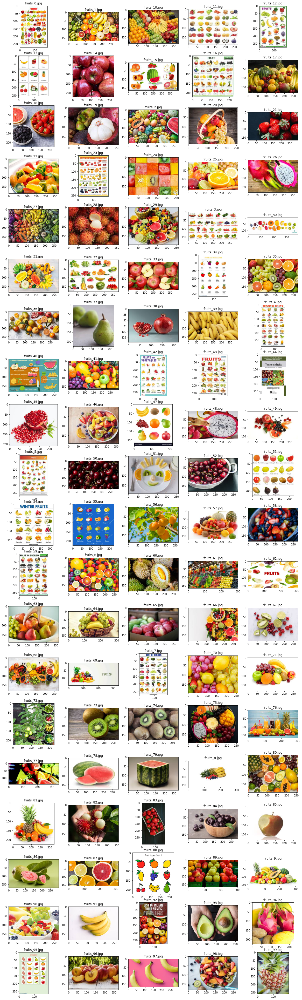

In [27]:
search_image('fruits')

100 Images of cars saved at  C:\Users\Piyush\cars 
 AxesImage(1103.59,630;192.414x159.882)


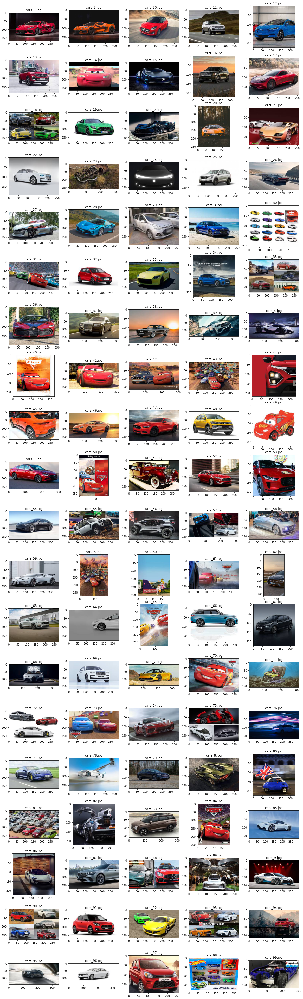

In [29]:
search_image('cars')

100 Images of Meachine Learning saved at  C:\Users\Piyush\Meachine Learning 
 AxesImage(1103.59,630;192.414x159.882)


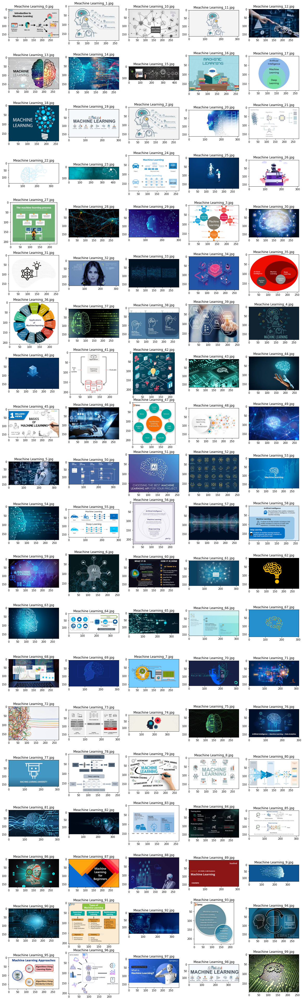

In [31]:
search_image('Meachine Learning')

Question 4: Write a python program to search for a smartphone(e.g.: Oneplus Nord, pixel 4A, etc.) on
www.flipkart.com and scrape following details for all the search results displayed on 1st page.
Details to be scraped: “Brand Name”, “Smartphone name”, “Colour”, “RAM”,
“Storage(ROM)”, “Primary Camera”, “Secondary Camera”, “Display Size”, “Display
Resolution”, “Processor”, “Processor Cores”, “Battery Capacity”, “Price”, “Product URL”.
Incase if any of the details is missing then replace it by “- “. Save your results in a dataframe
and CSV.

In [58]:
driver=webdriver.Chrome(r"C:\Users\Piyush\Downloads\chromedriver_win32 (1)\chromedriver.exe")
driver.get('https://www.flipkart.com/')

In [65]:
search_bar=driver.find_element_by_xpath("//input[@type='text']")
search_bar.send_keys('oppo')
driver.find_element_by_xpath('//button[@class="L0Z3Pu"]').click()

In [66]:
url="https://www.flipkart.com/search?q=oppo&otracker=search&otracker1=search&marketplace=FLIPKART&as-show=on&as=off"
driver.get(url)

In [67]:
product_urls=[]
brand_name=[]
phone_name=[]
phone_color=[]
RAM=[]
ROM=[]
p_cam=[]
s_cam=[]
d_size=[]
d_resolution=[]
processor=[]
processor_core=[]
battery=[]
price=[]

urls=driver.find_elements_by_xpath("//a[@class='_1fQZEK']")
for i in urls:
    product_urls.append(i.get_attribute('href'))
for i in product_urls:
    driver.get(i)
    
    driver.find_element_by_xpath("//button[@class='_2KpZ6l _1FH0tX']").click()
    
    try:
        brand=driver.find_element_by_xpath("//span[@class='B_NuCI']").text.split()
        brand_name.append(brand[0])
    except NoSuchElementException as e:
        brand_name.append('-')
        
    try:
        phone=driver.find_element_by_xpath("//div[@class='_1UhVsV']/div[1]/table/tbody/tr[3]/td[2]")
        phone_name.append(phone.text)
    except NoSuchElementException as e:
        phone_name.append('-')
        
    try:
        color=driver.find_element_by_xpath("//div[@class='_1UhVsV']/div[1]/table/tbody/tr[4]/td[2]")
        phone_color.append(color.text)
    except NoSuchElementException as e:
        phone_color.append('-')
        
    try:
        RAM.append(driver.find_element_by_xpath("//div[@class='_1UhVsV']/div[4]/table/tbody/tr[2]/td[2]").text)
    except NoSuchElementException as e:
        RAM.append('-')
        
    try:
        ROM.append(driver.find_element_by_xpath("//div[@class='_1UhVsV']/div[4]/table/tbody/tr[1]/td[2]").text)
    except NoSuchElementException as e:
        ROM.append('-')
    try:
        p_cam.append(driver.find_element_by_xpath("//div[@class='_1UhVsV']/div[5]/table/tbody/tr[2]/td[2]").text)
    except NoSuchElementException as e:
        p_cam.append('-')
    try:
        s_cam.append(driver.find_element_by_xpath("//div[@class='_1UhVsV']/div[5]/table/tbody/tr[5]/td[2]").text)
    except NoSuchElementException as e:
        s_cam.append('-')
    try:
        d_size.append(driver.find_element_by_xpath("//div[@class='_1UhVsV']/div[2]/table/tbody/tr[1]/td[2]").text)
    except NoSuchElementException as e:
        d_size.append('-')
    try:
        d_resolution.append(driver.find_element_by_xpath("//div[@class='_1UhVsV']/div[2]/table/tbody/tr[2]/td[2]").text)
    except NoSuchElementException as e:
        d_resolution.append('-')
    try:
        processor.append(driver.find_element_by_xpath("//div[@class='_1UhVsV']/div[3]/table/tbody/tr[2]/td[2]").text)
    except NoSuchElementException as e:
        processor.append('-')
    try:
        processor_core.append(driver.find_element_by_xpath("//div[@class='_1UhVsV']/div[3]/table/tbody/tr[3]/td[2]").text)
    except NoSuchElementException as e:
        processor_core.append('-')
    try:
        battery.append(driver.find_element_by_xpath("//div[@class='_1UhVsV']/div[10]/table/tbody/tr[1]/td[2]").text)
    except NoSuchElementException as e:
        battery.append('-')
    try:
        price.append(driver.find_element_by_xpath("//div[@class='dyC4hf']/div/div/div").text)
    except NoSuchElementException as e:
        price.append('-')

In [68]:
flipkart=pd.DataFrame({})
flipkart['brand']=brand_name
flipkart['phone_name']=phone_name
flipkart['color']=phone_color
flipkart['ram']=RAM
flipkart['ROM']=ROM
flipkart['primary camera']=p_cam
flipkart['secondary camera']=s_cam
flipkart['display_size']=d_size
flipkart['display resolution']=d_resolution
flipkart['processor']=processor
flipkart['processor core']=processor_core
flipkart['battery']=battery
flipkart['price']=price
flipkart['product_url']=product_urls

flipkart

,brand,phone_name,color,ram,ROM,primary camera,secondary camera,display_size,display resolution,processor,processor core,battery,price,product_url
0,OPPO,A53s 5G,Crystal Blue,6 GB,128 GB,13MP + 2MP + 2MP,8MP Front Camera,16.56 cm (6.52 inch),1600 x 720 Pixels,MediaTek Dimensity 700,Octa Core,Brand Warranty of 1 Year Available for Mobile ...,"₹13,990",https://www.flipkart.com/oppo-a53s-5g-crystal-...
1,OPPO,A53s 5G,Ink Black,6 GB,128 GB,13MP + 2MP + 2MP,8MP Front Camera,16.56 cm (6.52 inch),1600 x 720 Pixels,MediaTek Dimensity 700,Octa Core,Brand Warranty of 1 Year Available for Mobile ...,"₹13,990",https://www.flipkart.com/oppo-a53s-5g-ink-blac...
2,OPPO,A53s 5G,Crystal Blue,8 GB,128 GB,13MP + 2MP + 2MP,8MP Front Camera,16.56 cm (6.52 inch),1600 x 720 Pixels,MediaTek Dimensity 700,Octa Core,Brand Warranty of 1 Year Available for Mobile ...,"₹17,990",https://www.flipkart.com/oppo-a53s-5g-crystal-...
3,OPPO,A53s 5G,Ink Black,8 GB,128 GB,13MP + 2MP + 2MP,8MP Front Camera,16.56 cm (6.52 inch),1600 x 720 Pixels,MediaTek Dimensity 700,Octa Core,Brand Warranty of 1 Year Available for Mobile ...,"₹17,990",https://www.flipkart.com/oppo-a53s-5g-ink-blac...
4,OPPO,A53,Moonlight Black,4 GB,64 GB,13MP + 2MP + 2MP,16MP Front Camera,16.51 cm (6.5 inch),1600 x 720 Pixels,Qualcomm Snapdragon 460,Octa Core,5000 mAh,"₹11,990",https://www.flipkart.com/oppo-a53-moonlight-bl...
5,OPPO,A53,Mint Cream,4 GB,64 GB,13MP + 2MP + 2MP,16MP Front Camera,16.51 cm (6.5 inch),1600 x 720 Pixels,Qualcomm Snapdragon 460,Octa Core,5000 mAh,"₹11,990",https://www.flipkart.com/oppo-a53-mint-cream-6...
6,OPPO,A53,Mint Cream,6 GB,128 GB,13MP + 2MP + 2MP,16MP Front Camera,16.51 cm (6.5 inch),1600 x 720 Pixels,Qualcomm Snapdragon 460,Octa Core,5000 mAh,"₹13,990",https://www.flipkart.com/oppo-a53-mint-cream-1...
7,OPPO,A53,Moonlight Black,6 GB,128 GB,13MP + 2MP + 2MP,16MP Front Camera,16.51 cm (6.5 inch),1600 x 720 Pixels,Qualcomm Snapdragon 460,Octa Core,5000 mAh,"₹13,990",https://www.flipkart.com/oppo-a53-moonlight-bl...
8,OPPO,A12,Black,3 GB,32 GB,13MP + 2MP,5MP Front Camera,15.8 cm (6.22 inch),1520 x 720 Pixels,MediaTek Helio P35,Octa Core,4230 mAh,"₹9,490",https://www.flipkart.com/oppo-a12-black-32-gb/...
9,OPPO,A12,Blue,3 GB,32 GB,13MP + 2MP,5MP Front Camera,15.8 cm (6.22 inch),1520 x 720 Pixels,MediaTek Helio P35,Octa Core,4230 mAh,"₹9,490",https://www.flipkart.com/oppo-a12-blue-32-gb/p...


In [76]:
#saving the dataframe in csv
flipkart.to_csv(f"{'FlipKart searched Oppo'}.csv",index=False)

In [77]:
pd.read_csv('FlipKart searched Oppo.csv').head()

,brand,phone_name,color,ram,ROM,primary camera,secondary camera,display_size,display resolution,processor,processor core,battery,price,product_url
0,OPPO,A53s 5G,Crystal Blue,6 GB,128 GB,13MP + 2MP + 2MP,8MP Front Camera,16.56 cm (6.52 inch),1600 x 720 Pixels,MediaTek Dimensity 700,Octa Core,Brand Warranty of 1 Year Available for Mobile ...,"₹13,990",https://www.flipkart.com/oppo-a53s-5g-crystal-...
1,OPPO,A53s 5G,Ink Black,6 GB,128 GB,13MP + 2MP + 2MP,8MP Front Camera,16.56 cm (6.52 inch),1600 x 720 Pixels,MediaTek Dimensity 700,Octa Core,Brand Warranty of 1 Year Available for Mobile ...,"₹13,990",https://www.flipkart.com/oppo-a53s-5g-ink-blac...
2,OPPO,A53s 5G,Crystal Blue,8 GB,128 GB,13MP + 2MP + 2MP,8MP Front Camera,16.56 cm (6.52 inch),1600 x 720 Pixels,MediaTek Dimensity 700,Octa Core,Brand Warranty of 1 Year Available for Mobile ...,"₹17,990",https://www.flipkart.com/oppo-a53s-5g-crystal-...
3,OPPO,A53s 5G,Ink Black,8 GB,128 GB,13MP + 2MP + 2MP,8MP Front Camera,16.56 cm (6.52 inch),1600 x 720 Pixels,MediaTek Dimensity 700,Octa Core,Brand Warranty of 1 Year Available for Mobile ...,"₹17,990",https://www.flipkart.com/oppo-a53s-5g-ink-blac...
4,OPPO,A53,Moonlight Black,4 GB,64 GB,13MP + 2MP + 2MP,16MP Front Camera,16.51 cm (6.5 inch),1600 x 720 Pixels,Qualcomm Snapdragon 460,Octa Core,5000 mAh,"₹11,990",https://www.flipkart.com/oppo-a53-moonlight-bl...


Question 5: Write a program to scrap geospatial coordinates (latitude, longitude) of a city searched on
google maps.

In [80]:
def GoogleMaps(search_city):
    """Generate a URL for search Term"""
    template = 'https://www.google.com/maps/place/{}/'
    search_city = search_city.replace(' ','+')
    return template.format(search_city)

def search_coordinates(search_city): #Creating Function for searching the location and returns the coordinates.
    driver=webdriver.Chrome(r"C:\Users\Piyush\Downloads\chromedriver_win32 (1)\chromedriver.exe")
    url = GoogleMaps(search_city)
    driver.get(url)
    driver.maximize_window()
    button = driver.find_element_by_xpath("//button[@aria-label = 'Search']")
    button.click()
    time.sleep(5)

    coordinates = [driver.current_url]
    driver.close()
    coordinates = [i.split('@')[1] for i in coordinates]
    coordinates = [i.split(',')[:2] for i in coordinates]
    coordinates = coordinates[0]
    
    return print(f"The geospatial coordinates of {search_city} \n Lattitude:", coordinates[0], "\n Longitude:", coordinates[1])

In [81]:
search_coordinates("Chennai")

The geospatial coordinates of Chennai 
 Lattitude: 13.0473748 
 Longitude: 79.9288101


In [82]:
search_coordinates("Moscow Russia")

The geospatial coordinates of Moscow Russia 
 Lattitude: 55.580748 
 Longitude: 36.8251156


In [83]:
search_coordinates("Flip Robo Banglore")

The geospatial coordinates of Flip Robo Banglore 
 Lattitude: 12.9779987 
 Longitude: 77.6374416


In [84]:
search_coordinates("Data Trained Noida")

The geospatial coordinates of Data Trained Noida 
 Lattitude: 28.6069014 
 Longitude: 77.3652924


In [85]:
search_coordinates("IIT Madras")

The geospatial coordinates of IIT Madras 
 Lattitude: 12.9947794 
 Longitude: 80.2244701


Question 6: Write a program to scrap details of all the funding deals for second quarter (i.e. July 20 – September 20) from trak.in.

In [87]:
driver=webdriver.Chrome(r"C:\Users\Piyush\Downloads\chromedriver_win32 (1)\chromedriver.exe")
url = 'https://trak.in/india-startup-funding-investment-2015/'
driver.get(url)
driver.maximize_window()
time.sleep(5)
#searching the Funding Details from trak.in

SRNO = []
Date = []
strtup = []
industry = []
Sub_Vertical = []
city = []
Investors = []
Investment_type = []
amount = []

for j in 48, 49,50: #Collecting all the funding details of july, aug sep of 2020 which is in indexes of 48,49,50
    dropdown = driver.find_element_by_xpath(f"//div[@class = 'dataTables_length']//select[@name = 'tablepress-{j}_length']")
    dropdown.send_keys("100")
    
    
    for i in driver.find_elements_by_xpath(f"//table[@id = 'tablepress-{j}']//td[@class = 'column-1']"):
        SRNO.append(i.text)

    for i in driver.find_elements_by_xpath(f"//table[@id = 'tablepress-{j}']//td[@class = 'column-2']"):
        Date.append(i.text)        
  
    for i in driver.find_elements_by_xpath(f"//table[@id = 'tablepress-{j}']//td[@class = 'column-3']"):
        strtup.append(i.text)

    for i in driver.find_elements_by_xpath(f"//table[@id = 'tablepress-{j}']//td[@class = 'column-4']"):
        industry.append(i.text)    
    
    for i in driver.find_elements_by_xpath(f"//table[@id = 'tablepress-{j}']//td[@class = 'column-5']"):
        Sub_Vertical.append(i.text)

    for i in driver.find_elements_by_xpath(f"//table[@id = 'tablepress-{j}']//td[@class = 'column-6']"):
        city.append(i.text)

    for i in driver.find_elements_by_xpath(f"//table[@id = 'tablepress-{j}']//td[@class = 'column-7']"):
        Investors.append(i.text)    

    for i in driver.find_elements_by_xpath(f"//table[@id = 'tablepress-{j}']//td[@class = 'column-8']"):
        Investment_type.append(i.text)

    for i in driver.find_elements_by_xpath(f"//table[@id = 'tablepress-{j}']//td[@class = 'column-9']"):
        amount.append(i.text)
    
driver.close()
    
#Creating DataFrame from the collected details

Funding_Deals=pd.DataFrame({"SRNO":SRNO,
                            "Date":Date,
                            "Start_Up":strtup,
                            "Industry":industry,
                            "Sub_Vertical":Sub_Vertical,
                            "City":city,
                            "Investors":Investors,
                            "Investment_type":Investment_type,
                            "Amount":amount})

Funding_Deals

,SRNO,Date,Start_Up,Industry,Sub_Vertical,City,Investors,Investment_type,Amount
0,1,15/07/2020,Flipkart,E-commerce,E-commerce,Bangalore,Walmart Inc,M&A,"1,200,000,000"
1,2,16/07/2020,Vedantu,EduTech,Online Tutoring,Bangalore,Coatue Management,Series D,"100,000,000"
2,3,16/07/2020,Crio,EduTech,Learning Platform for Developers,Bangalore,021 Capital,pre-Series A,"934,160"
3,4,14/07/2020,goDutch,FinTech,Group Payments,Mumbai,"Matrix India,Y Combinator, Global Founders Cap...",Seed,"1,700,000"
4,5,13/07/2020,Mystifly,Airfare Marketplace,"Ticketing, Airline Retailing, and Post-Ticketi...",Singapore and Bangalore,Recruit Co. Ltd.,pre-Series B,"3,300,000"
5,6,09/07/2020,JetSynthesys,Gaming and Entertainment,Gaming and Entertainment,Pune,Adar Poonawalla and Kris Gopalakrishnan.,Venture-Series Unknown,"400,000"
6,7,10/07/2020,gigIndia,Marketplace,"Crowd Sourcing, Freelance",Pune,Incubate Fund India and Beyond Next Ventures,pre-Series A,"974,200"
7,8,15/07/2020,PumPumPum,Automotive Rental,Used Car-leasing platform,Gurgaon,Early Adapters Syndicate,Seed,"292,800"
8,9,14/07/2020,FLYX,OTT Player,Streaming Social Network,New York and Delhi,"Raj Mishra, founder of AIT Global Inc",pre-Seed,"200,000"
9,10,13/07/2020,Open Appliances Pvt. Ltd.,Information Technology,Internet-of-Things Security Solutions,Bangalore,Unicorn India Ventures,Venture-Series Unknown,"500,000"


Question 7: Write a program to scrap all the available details of best gaming laptops from digit.in.

In [88]:
def digitin(gaming_laptop):
    gaming_laptop=gaming_laptop.replace(' ','+')
    template=f'https://www.digit.in/search?keyword={gaming_laptop}&keywordby=toptens'
    driver=webdriver.Chrome(r"C:\Users\Piyush\Downloads\chromedriver_win32 (1)\chromedriver.exe")
    driver.get(template)
    driver.maximize_window()
    for i in driver.find_elements_by_xpath("//div[@class='searchPage']//a"):
        if i.text=="Best Gaming Laptops in India":
            i.click()
            break
    index=[]
    for i in driver.find_elements_by_xpath("//table[@id='summtable']//td"):
        index.append(i.text)
    title=[]
    merchant=[]
    price=[]
    os=[]
    display=[]
    processor=[]
    memory=[]
    weight=[]
    dimension=[]
    graphics=[]
    
    z=0
    while z<len(index):
        title.append(index[z])
        z+=1
        merchant.append(index[z])
        z+=1
        price.append(index[z])
        z+=1
        
    dummy=[i.text for i in driver.find_elements_by_xpath("//div[@class='Spcs-details']//tr")]
    driver.close()
    dummy=[i.split(" : ") for i in dummy]
    Dummy=[j for i in dummy for j in i]
    for i in range(0,len(Dummy)):
        if Dummy[i] == 'OS':
            os.append(Dummy[i+1])
        if Dummy[i] == 'Display':
            display.append(Dummy[i+1])
        if Dummy[i] == 'Processor':
            processor.append(Dummy[i+1])
        if Dummy[i] == 'Memory':
            memory.append(Dummy[i+1])
        if Dummy[i] == 'Weight':
            weight.append(Dummy[i+1])
        if Dummy[i] == 'Dimension':
            dimension.append(Dummy[i+1])
        if Dummy[i] == 'Graphics Processor':
            graphics.append(Dummy[i+1])
            
    best_gaming_laptops=pd.DataFrame({"title":title,
                                     "os":os,
                                     "display":display,
                                     "processor":processor,
                                     "memory":memory,
                                     "weight":weight,
                                     "dimension":dimension,
                                     "graphics":graphics,
                                     "can_buy_from":merchant,
                                     "price":price})
    return best_gaming_laptops

In [89]:
laptop=digitin("gaming laptop")
laptop

,title,os,display,processor,memory,weight,dimension,graphics,can_buy_from,price
0,Alienware Area 51M R2,Windows 10 Home,"17.3"" (1920 x 1080)",10th Generation Intel® Core™ i7-10700 | 2.90 GHz,1 TB SSD/16 GBGB DDR4,4.1,27.65 x 402.6 x 319.14,Intel® UHD Graphics 630,N/A,N/A
1,Alienware m15 R3,Windows 10 Home,"15.6"" (3840 x 2160)",10th Generation Intel® Core™ i9-10980HK | NA,1 TB SSD/16 GBGB DDR4,NA,NA,NA,Amazon,"₹ 319,990"
2,ASUS ROG Strix Scar 15,Windows 10 Home,"15.6"" (1920 x 1080)",AMD Ryzen™ 9 5900HX | 3.3 GHz,1 TB SSD/16 GBGB DDR4,2.30,35.4 x 25.9 x 2.26,NVIDIA® GeForce RTX™ 3070,Flipkart,"₹ 215,990"
3,Asus ROG Zephyrus G14,Windows 10 Home,"14"" (1920 x 1080)",AMD 3rd Generation Ryzen 9 | 3.3 GHz,1 TB SSD/16 GBGB DDR4,1.65,32.5 x 22.1 x 1.8,NVIDIA GeForce RTX 2060,Amazon,"₹ 164,990"
4,Lenovo Legion 5i,Windows 10 Pro,"15.6"" (1920 x 1080)",10th Generation Intel® Core™ i5-10300H | 2.50 GHz,1 TB SSD/16 GBGB DDR4,2.3,363.06 x 259.61 x 23.57,NVIDIA® GeForce® GTX 1650 4GB,Amazon,"₹ 76,988"
5,ASUS ROG ZEPHYRUS DUO 15,Windows 10,"15.6"" (3840 x 1100)",Intel Core i7 10th Gen 10875H | NA,512 GB SSD/4 GBGB DDR4,2.4,268.30 x 360.00 x 20.90,NVIDIA GeForce RTX 2070 Max-Q,Amazon,"₹ 185,000"
6,Acer Aspire 7 gaming,Windows 10 Home,"15.6"" (1920 x 1080)",AMD Ryzen™ 5-5500U hexa-core | NA,512 GB SSD/8 GBGB DDR4,2.15,2.29 x 36.3 x 25.4,NVIDIA® GeForce® GTX 1650,Amazon,"₹ 64,370"


Question 8: Write a python program to scrape the details for all billionaires from www.forbes.com.
Details to be scrapped: “Rank”, “Name”, “Net worth”, “Age”, “Citizenship”, “Source”,
“Industry”.

In [91]:
driver=webdriver.Chrome(r"C:\Users\Piyush\Downloads\chromedriver_win32 (1)\chromedriver.exe")
driver.get('https://www.forbes.com/')

In [92]:
button_bar=driver.find_element_by_xpath("//button[@class='icon--hamburger']")
button_bar.click()